Text recognition을 위해 특화된 데이터셋 구성이 체계적으로 진행되었다.
- 텍스트 이미지 리사이징, ctc loss 측정을 위한 라벨 인코딩, 배치처리 등이 적절히 수행되었다.

CRNN 기반의 recognition 모델의 학습이 정상적으로 진행되었다.
- 학습결과 loss가 안정적으로 감소하고 대부분의 문자인식 추론 결과가 정확하다.

keras-ocr detector와 CRNN recognizer를 엮어 원본 이미지 입력으로부터 text가 출력되는 OCR이 End-to-End로 구성되었다.
- 샘플 이미지를 원본으로 받아 OCR 수행 결과를 리턴하는 1개의 함수가 만들어졌다.

In [ ]:
import re
import os
import six
import math
import lmdb
import cv2
import numpy as np
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import easyocr
import albumentations as A
from albumentations.pytorch import ToTensorV2

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from IPython.display import display

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

TRAIN_DATA_PATH = './MJ/MJ_train'
VALID_DATA_PATH = './MJ/MJ_valid'
TEST_DATA_PATH  = './MJ/MJ_test'

print(TRAIN_DATA_PATH)

Using device: cuda
./MJ/MJ_train


In [36]:
import string

# 숫자와 대문자 알파벳을 포함한 문자열을 만듭니다.
# 보통 OCR 학습 시 0~9, A~Z를 타겟으로 합니다.
NUMBERS = "0123456789"
ENG_CHAR_UPPER = "ABCDEFGHIJKLMNOPQRSTUVWXYZ"
TARGET_CHARACTERS = ENG_CHAR_UPPER + NUMBERS

original image width:72, height:31
target_img_size:(74, 32)
display img shape:(74, 32, 3)
label:Lube


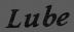

original image width:82, height:31
target_img_size:(84, 32)
display img shape:(84, 32, 3)
label:Spencerian


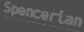

original image width:115, height:31
target_img_size:(100, 32)
display img shape:(100, 32, 3)
label:accommodatingly


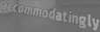

original image width:140, height:31
target_img_size:(100, 32)
display img shape:(100, 32, 3)
label:CARPENTER


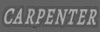

In [ ]:
from IPython.display import display
train_transform = A.Compose([
    A.Rotate(limit=10, p=0.5),             # -10~10도 랜덤 회전
    A.GaussianBlur(blur_limit=3, p=0.3),   # 흐리게 만들기
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.3), # 노이즈 추가
    A.RandomBrightnessContrast(p=0.5),     # 밝기/대비 조절
    # A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)), # 필요시 정규화 추가
    # ToTensorV2() # PyTorch Tensor 변환은 보통 마지막 CRNN 전처리에서 하므로 여기서는 생략 추천
])
# env에 데이터를 불러올게요
# lmdb에서 데이터를 불러올 때 env라는 변수명을 사용하는게 일반적이에요
env = lmdb.open(TRAIN_DATA_PATH,
                max_readers=32,
                readonly=True,
                lock=False,
                readahead=False,
                meminit=False)

# 불러온 데이터를 txn(transaction)이라는 변수를 통해 엽니다
# 이제 txn변수를 통해 직접 데이터에 접근 할 수 있어요
with env.begin(write=False) as txn:
    for index in range(1, 5):
        # index를 이용해서 라벨 키와 이미지 키를 만들면
        # txn에서 라벨과 이미지를 읽어올 수 있어요
        label_key = 'label-%09d'.encode() % index
        label = txn.get(label_key).decode('utf-8')
        img_key = 'image-%09d'.encode() % index
        imgbuf = txn.get(img_key)
        buf = six.BytesIO()
        buf.write(imgbuf)
        buf.seek(0)

        # 이미지는 버퍼를 통해 읽어오기 때문에
        # 버퍼에서 이미지로 변환하는 과정이 다시 필요해요
        try:
            img = Image.open(buf).convert('RGB')

        except IOError:
            img = Image.new('RGB', (100, 32))
            label = '-'

        # 원본 이미지 크기를 출력해 봅니다
        width, height = img.size
        print('original image width:{}, height:{}'.format(width, height))

        # 이미지 비율을 유지하면서 높이를 32로 바꿀거에요
        # 하지만 너비를 100보다는 작게하고 싶어요
        target_width = min(int(width*32/height), 100)
        target_img_size = (target_width,32)
        print('target_img_size:{}'.format(target_img_size))
        img = np.array(img.resize(target_img_size)).transpose(1,0,2)

        # 이제 높이가 32로 일정한 이미지와 라벨을 함께 출력할 수 있어요
        print('display img shape:{}'.format(img.shape))
        print('label:{}'.format(label))
        display(Image.fromarray(img.transpose(1,0,2).astype(np.uint8)))

In [ ]:
import lmdb
import six
from PIL import Image
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import re

class MJDataset(Dataset):
    def __init__(
        self,
        dataset_path,
        label_converter,
        img_size=(100, 32),
        max_text_len=22,
        character="",
        transform=None
    ):
        super().__init__()
        self.label_converter = label_converter
        self.img_size = img_size
        self.max_text_len = max_text_len
        self.character = character
        self.dataset_path = dataset_path
        self.env = None  # 여기서는 None으로 초기화
        self.transform = transform
        

        # 데이터 개수만 미리 파악하기 위해 잠시 열었다가 닫습니다.
        env = lmdb.open(dataset_path, max_readers=32, readonly=True, lock=False, readahead=False, meminit=False)
        with env.begin(write=False) as txn:
            self.num_samples = int(txn.get("num-samples".encode()))
            self.index_list = [idx + 1 for idx in range(self.num_samples)]
        env.close()

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        # 실제 데이터를 읽을 때 env가 없으면 엽니다 (Lazy Loading)
        if self.env is None:
            self.env = lmdb.open(self.dataset_path, max_readers=32, readonly=True, lock=False, readahead=False, meminit=False)

        index = self.index_list[idx]
        with self.env.begin(write=False) as txn:
            label_key = f"label-{index:09d}".encode()
            label = txn.get(label_key).decode("utf-8")

            img_key = f"image-{index:09d}".encode()
            imgbuf = txn.get(img_key)

            buf = six.BytesIO()
            buf.write(imgbuf)
            buf.seek(0)

            try:
                img_pil = Image.open(buf).convert("RGB")
            except IOError:
                img_pil = Image.new("RGB", self.img_size)
                label = "-"

        orig_w, orig_h = img_pil.size
        target_width = min(int(orig_w * self.img_size[1] / orig_h), self.img_size[0])
        target_img_size = (target_width, self.img_size[1])
        img_pil = img_pil.resize(target_img_size)

        img = np.array(img_pil)
        img = img.transpose(2, 0, 1)

        padded_img = np.zeros((3, self.img_size[1], self.img_size[0]), dtype=np.float32)
        c, h, w = img.shape
        padded_img[:, :h, :w] = img

        # 레이블 전처리
        label = label.upper()
        out_of_char = f"[^{self.character}]"
        label = re.sub(out_of_char, "", label)
        label = label[: self.max_text_len]

        encoded_label = self.label_converter.encode(label)

        return padded_img, encoded_label, len(encoded_label), label

In [39]:
def collate_fn(batch):
    imgs, encoded_labels, label_lens, raw_labels = zip(*batch)

    imgs_tensor = torch.tensor(np.stack(imgs, axis=0), dtype=torch.float32)

    max_len = max(label_lens)
    labels_padded = torch.zeros(len(batch), max_len, dtype=torch.long)
    for i, label_arr in enumerate(encoded_labels):
        length = label_lens[i]
        labels_padded[i, :length] = torch.tensor(label_arr, dtype=torch.long)

    batch_size = imgs_tensor.size(0)
    # 여기서는 크기 24로 가정
    input_length = torch.full(size=(batch_size,), fill_value=24, dtype=torch.long)
    label_length = torch.tensor(label_lens, dtype=torch.long)

    return (
        imgs_tensor,
        labels_padded,
        input_length,
        label_length,
        raw_labels,  # 디버깅용
    )

In [40]:
class LabelConverter(object):

     def __init__(self, character):
         self.character = "-" + character
         self.label_map = dict()
         for i, char in enumerate(self.character):
             self.label_map[char] = i

     def encode(self, text):
         encoded_label = []
         for i, char in enumerate(text):
             if i > 0 and char == text[i - 1]:
                 encoded_label.append(0)    # 같은 문자 사이에 공백 문자 label을 삽입
             encoded_label.append(self.label_map[char])
         return np.array(encoded_label, dtype=np.int32)

     def decode(self, encoded_label):
        target_characters = list(self.character)
        decoded_label = ""
        for encode in encoded_label:
            decoded_label += self.character[encode]
        return decoded_label
print("슝~")

슝~


In [41]:
label_converter = LabelConverter(TARGET_CHARACTERS)
#label_converter = LabelConverter(target_characters)

encdoded_text = label_converter.encode('HELLO')
print("Encdoded_text: ", encdoded_text)
decoded_text = label_converter.decode(encdoded_text)
print("Decoded_text: ", decoded_text)


Encdoded_text:  [ 8  5 12  0 12 15]
Decoded_text:  HEL-LO


In [42]:
criterion = nn.CTCLoss(blank=0, reduction='mean', zero_infinity=True)

print("슝~")

슝~


In [43]:
class CRNN(nn.Module):
    def __init__(self, num_chars, img_height=32, img_width=100):
        super(CRNN, self).__init__()
        # num_chars: 실제 문자 개수(+2) -> 여기서는 +2(CTC Blank 등)를
        # LabelConverter에서 이미 blank를 붙여줬으니,
        # 파이토치의 CTCLoss는 blank 인덱스를 지정 가능하므로, +2 없이 설계할 수 있음.
        # 여기서는 blank를 0번으로 하므로 굳이 +2가 필요 없을 수 있습니다.
        # 필요시엔 +1 혹은 +2로 조정하세요.
        self.num_chars = num_chars

        # (3, H, W) -> (64, H, W)
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.pool1 = nn.MaxPool2d(2, 2)  # (64, H/2, W/2)

        # (64, H/2, W/2) -> (128, H/2, W/2)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool2 = nn.MaxPool2d(2, 2)  # (128, H/4, W/4)

        # (128, H/4, W/4) -> (256, H/4, W/4)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.conv4 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.pool3 = nn.MaxPool2d((1, 2))  # (256, H/4, W/8)

        # (256, H/4, W/8) -> (512, H/4, W/8)
        self.conv5 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.bn6 = nn.BatchNorm2d(512)
        self.pool4 = nn.MaxPool2d((1, 2))  # (512, H/4, W/16)

        # (512, H/4, W/16) -> (512, (H/4)-1, (W/16)-1) conv(2,2)
        self.conv7 = nn.Conv2d(512, 512, kernel_size=(2, 2))
        # 최종 (512, (H/4)-1, (W/16)-1)
        # 예) H=32 -> H/4=8 -> (8)-1=7
        #     W=100 -> W/16=6.25 -> 실제 integer shape는 계산 필요
        # 텐서플로우 예시에선 (24, 512) 시퀀스로 reshape했으니, 여기선 실제 연산으로 확인 필요

        # Bi-LSTM
        self.lstm1 = nn.LSTM(512, 256, bidirectional=True, batch_first=True)
        self.lstm2 = nn.LSTM(512, 256, bidirectional=True, batch_first=True)

        # 최종 fc
        self.fc = nn.Linear(512, self.num_chars)

    def forward(self, x):
        # (B,3,32,100)
        x = F.relu(self.conv1(x))      # -> (B,64,32,100)
        x = self.pool1(x)             # -> (B,64,16,50)
        x = F.relu(self.conv2(x))      # -> (B,128,16,50)
        x = self.pool2(x)             # -> (B,128,8,25)
        x = F.relu(self.conv3(x))      # -> (B,256,8,25)
        x = F.relu(self.conv4(x))      # -> (B,256,8,25)
        x = self.pool3(x)             # -> (B,256,8,12) (25->12)
        x = F.relu(self.conv5(x))      # -> (B,512,8,12)
        x = self.bn5(x)
        x = F.relu(self.conv6(x))      # -> (B,512,8,12)
        x = self.bn6(x)
        x = self.pool4(x)             # -> (B,512,8,6)
        x = F.relu(self.conv7(x))      # -> (B,512,7,5) (8->7, 6->5)

        b, c, h, w = x.size()
        # 시퀀스 길이 = h*w
        x = x.view(b, c, h * w)  # (B,512,35)
        x = x.permute(0, 2, 1)   # (B,35,512)

        # LSTM
        x, _ = self.lstm1(x)    # (B,35,512)
        x, _ = self.lstm2(x)    # (B,35,512)

        # 최종 FC
        x = self.fc(x)          # (B,35,num_chars)

        # PyTorch의 CTCLoss를 위해선 (T,B,C) 형태가 일반적
        # 여기서는 (B,T,C) -> (T,B,C)
        x = x.permute(1, 0, 2)  # (35,B,num_chars)
        return x

In [44]:
MAX_TEXT_LEN = 22
IMG_SIZE = (100, 32)
BATCH_SIZE = 128

train_dataset = MJDataset(TRAIN_DATA_PATH,label_converter=label_converter,img_size=IMG_SIZE,character=TARGET_CHARACTERS)
valid_dataset = MJDataset(VALID_DATA_PATH,label_converter=label_converter,img_size=IMG_SIZE,character=TARGET_CHARACTERS)
test_dataset = MJDataset(TEST_DATA_PATH,label_converter=label_converter,img_size=IMG_SIZE,character=TARGET_CHARACTERS)

# 마지막 배치는 생략합니다.
train_loader = DataLoader(train_dataset,batch_size=BATCH_SIZE,shuffle=False,num_workers=0,collate_fn=collate_fn,drop_last=False)
valid_loader = DataLoader(valid_dataset,batch_size=BATCH_SIZE,shuffle=False,num_workers=0,collate_fn=collate_fn,drop_last=False)
test_loader = DataLoader(test_dataset,batch_size=BATCH_SIZE,shuffle=False,num_workers=0,collate_fn=collate_fn,drop_last=False)

In [45]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
label_converter = LabelConverter(TARGET_CHARACTERS)
num_chars = len(label_converter.character)

model = CRNN(num_chars=num_chars).to(device)

criterion = nn.CTCLoss(blank=0, reduction='mean', zero_infinity=True)
optimizer = optim.Adadelta(model.parameters(), lr=0.1)

In [46]:
import os
import matplotlib.pyplot as plt

def run_training(
        train_loader,
        valid_loader,
        model,
        optimizer,
        criterion,
        patience=2,
        epochs=1,
        checkpoint_path="./MJ/model_checkpoint.pth"
        ):

    best_val_loss = float('inf')
    patience_counter = 0
    batch_limit = 500
    
    # [추가] Loss history를 저장할 리스트 초기화
    train_loss_history = []
    valid_loss_history = []

    print("학습시작!...")

    for epoch in range(1, epochs+1):
        model.train()
        train_loss = 0.0
        train_batches = 0 # [수정] 실제로 처리된 배치 수를 카운트
        for idx, (imgs, labels_padded, input_lengths, label_lengths, _) in enumerate(train_loader):
            if idx == batch_limit:
                break
            imgs = imgs.to(device)
            labels_padded = labels_padded.to(device)
            input_lengths = input_lengths.to(device)
            label_lengths = label_lengths.to(device)

            optimizer.zero_grad()
            outputs = model(imgs)  # (T,B,C)

            # CTCLoss는 입력 (T,B,C), 타겟 (B,S), input_length, target_length
            loss = criterion(outputs, labels_padded, input_lengths, label_lengths)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            train_batches += 1

        model.eval()
        valid_loss = 0.0
        valid_batches = 0 # [수정] 실제로 처리된 배치 수를 카운트
        with torch.no_grad():
            for idx, (imgs, labels_padded, input_lengths, label_lengths, _) in enumerate(valid_loader):
                if idx == batch_limit:
                    break
                imgs = imgs.to(device)
                labels_padded = labels_padded.to(device)
                input_lengths = input_lengths.to(device)
                label_lengths = label_lengths.to(device)

                outputs = model(imgs)
                loss = criterion(outputs, labels_padded, input_lengths, label_lengths)
                valid_loss += loss.item()
                valid_batches += 1
        
        # [수정] 정확한 평균 손실 계산 및 기록
        avg_train_loss = train_loss / train_batches if train_batches > 0 else 0
        avg_valid_loss = valid_loss / valid_batches if valid_batches > 0 else 0
        train_loss_history.append(avg_train_loss)
        valid_loss_history.append(avg_valid_loss)


        print(f"[Epoch {epoch}/{epochs}] train_loss={avg_train_loss:.4f}, val_loss={avg_valid_loss:.4f}")

        # ---------------------------------------------------------
        # [추가된 부분] 10 에포크마다 저장 (예: model_checkpoint_epoch_10.pth)
        # ---------------------------------------------------------
        if epoch % 10 == 0:
            # 기존 경로에서 확장자를 분리하여 epoch 번호를 붙입니다.
            periodic_path = checkpoint_path.replace('.pth', f'_epoch_{epoch}.pth')
            torch.save(model.state_dict(), periodic_path)
            print(f"Periodic model saved at {periodic_path}")
        # ---------------------------------------------------------

        # Best Model 체크포인트 저장 (기존 로직)
        if valid_loss < best_val_loss:
            best_val_loss = valid_loss
            patience_counter = 0
            torch.save(model.state_dict(), checkpoint_path)
            print(f"Model improved. Saved at {checkpoint_path}")
        else:
            patience_counter += 1

        # EarlyStopping
        #if patience_counter >= patience:
        #    print("Early stopping triggered.")
        #    break

    # --- 그래프 그리기 추가 (NameError 해결) ---
    plt.figure(figsize=(10, 5))
    plt.plot(train_loss_history, label='Train Loss', marker='o')
    plt.plot(valid_loss_history, label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    # 이미지 파일로 저장
    plt.savefig('loss_history.png')
    

    return model

학습시작!...
[Epoch 1/50] train_loss=2.9727, val_loss=2.7802
Model improved. Saved at ./MJ/model_checkpoint.pth
[Epoch 2/50] train_loss=2.9188, val_loss=2.6670
Model improved. Saved at ./MJ/model_checkpoint.pth
[Epoch 3/50] train_loss=2.8167, val_loss=2.9833
[Epoch 4/50] train_loss=2.6525, val_loss=2.4285
Model improved. Saved at ./MJ/model_checkpoint.pth
[Epoch 5/50] train_loss=2.4093, val_loss=2.0186
Model improved. Saved at ./MJ/model_checkpoint.pth
[Epoch 6/50] train_loss=2.0535, val_loss=1.5743
Model improved. Saved at ./MJ/model_checkpoint.pth
[Epoch 7/50] train_loss=1.6208, val_loss=1.0548
Model improved. Saved at ./MJ/model_checkpoint.pth
[Epoch 8/50] train_loss=1.2652, val_loss=1.6098
[Epoch 9/50] train_loss=1.0271, val_loss=1.3386
[Epoch 10/50] train_loss=0.8615, val_loss=1.1645
Periodic model saved at ./MJ/model_checkpoint_epoch_10.pth
[Epoch 11/50] train_loss=0.7291, val_loss=1.5577
[Epoch 12/50] train_loss=0.6294, val_loss=0.4740
Model improved. Saved at ./MJ/model_checkpoint.

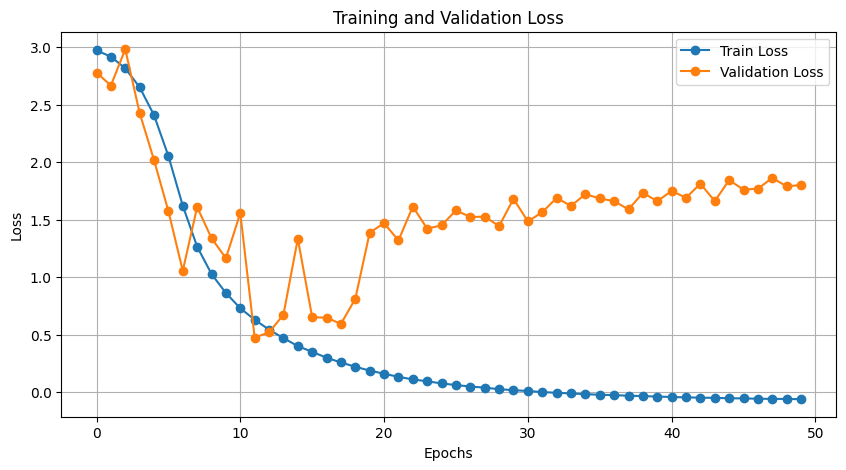

CPU times: total: 27min 3s
Wall time: 27min 49s


<Figure size 640x480 with 0 Axes>

In [107]:
%%time

model = run_training(
    train_loader,
    valid_loader,
    model,
    optimizer,
    criterion,
    patience=3,
    epochs=50,
    checkpoint_path="./MJ/model_checkpoint.pth"
    )

테스트 진행

In [47]:
def decode_greedy(output, label_converter):
    # (T,B,C) -> (B,T) index
    out = output.detach().cpu().numpy()  # (T,B,C)
    argmax = out.argmax(axis=2).transpose()  # (B,T)

    results = []
    for seq in argmax:
        # 연속된 동일 글자(또는 blank=0) 제거 로직을 적용해야
        # CTC 디코딩다운 결과가 나옵니다.
        # 여기서는 간단히 blank(0) 무시하고 연속 제거만 보여줌
        decoded = []
        prev = None
        for idx in seq:
            if idx != 0 and idx != prev:
                decoded.append(idx)
            prev = idx
        # 인덱스를 실제 문자로
        decoded_str = label_converter.decode(decoded).replace('-', '')
        results.append(decoded_str)
    return results


def check_inference(model, dataset, index=5):
    for i in range(index):
        img, encoded_label, label_len, raw_label = dataset[i]  # 단일 데이터
        img_tensor = torch.tensor(img[np.newaxis, ...], dtype=torch.float32).to(device)  # (1,3,32,100)
        output = model(img_tensor)  # (T,1,num_chars)
        # 디코딩
        result_text = decode_greedy(output, label_converter)[0]
        print(f"GT: {raw_label} / Pred: {result_text}")

        # 이미지를 시각화하고 싶으면
        display(Image.fromarray(img.transpose(1,2,0).astype(np.uint8)))

In [48]:
import numpy as np
from tqdm.auto import tqdm

# 편집 거리(Levenshtein Distance) 계산 함수 (라이브러리 없이 구현)
def levenshtein_distance(s1, s2):
    if len(s1) < len(s2):
        return levenshtein_distance(s2, s1)
    if len(s2) == 0:
        return len(s1)
    previous_row = range(len(s2) + 1)
    for i, c1 in enumerate(s1):
        current_row = [i + 1]
        for j, c2 in enumerate(s2):
            insertions = previous_row[j + 1] + 1
            deletions = current_row[j] + 1
            substitutions = previous_row[j] + (c1 != c2)
            current_row.append(min(insertions, deletions, substitutions))
        previous_row = current_row
    return previous_row[-1]

# 모델 성능 평가 함수
def evaluate_model(model, data_loader, label_converter, device):
    model.eval()
    total_count = 0
    correct_count = 0
    total_cer = 0.0
    
    with torch.no_grad():
        for batch in tqdm(data_loader, desc="Evaluating"):
            # collate_fn이 반환하는 5번째 요소가 raw_labels(정답 문자열)입니다.
            imgs, _, _, _, raw_labels = batch
            imgs = imgs.to(device)
            
            # 모델 예측
            outputs = model(imgs)
            
            # 결과 디코딩 (decode_greedy 함수 사용 가정)
            # decode_greedy 함수는 notebook에 이미 정의되어 있어야 합니다.
            pred_strs = decode_greedy(outputs, label_converter)
            
            for pred, target in zip(pred_strs, raw_labels):
                # 대소문자 통일 (평가 기준에 따라 다를 수 있음)
                pred = pred.upper()
                target = target.upper()
                
                # Accuracy 계산 (완전 일치)
                if pred == target:
                    correct_count += 1
                
                # CER 계산 (편집 거리 / 정답 길이)
                if len(target) > 0:
                    cer = levenshtein_distance(pred, target) / len(target)
                else:
                    cer = 0 if len(pred) == 0 else 1
                total_cer += cer
                
                total_count += 1
    
    accuracy = correct_count / total_count if total_count > 0 else 0
    avg_cer = total_cer / total_count if total_count > 0 else 0
    
    return accuracy, avg_cer

C:\Users\user\AppData\Local\Temp\ipykernel_20816\1204569321.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_10.load_state_dict(torch.load(ckpt_path_10))
Evaluating

Epoch 10 Model - Accuracy: 0.1129, CER: 0.3950


Evaluating: 100%|██████████| 6969/6969 [04:11<00:00, 27.74it/s]


Epoch 50 Model - Accuracy: 0.1134, CER: 0.3933
Ground Truth         | Epoch 10 Pred        | Epoch 50 Pred       
----------------------------------------------------------------------
SLINKING             | SLIKINGSGY           | SLIKINGSG           


C:\Users\user\AppData\Local\Temp\ipykernel_20816\1204569321.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_10.load_state_dict(torch.load(ckpt_path_10, map_locati

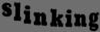

REMODELERS           | REDLIS               | RENODATST           


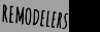

CHRONOGRAPHS         | CHAEAPPOPS           | CHEONRERPOPHS       


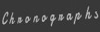

IMPEACHING           | IMPPEAACHINGSGY      | IMPEACHINGSGYG      


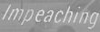

DISCOMBOBULATED      | TUEANBALY            | FIERNHTBEREDYT      


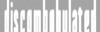

LOOTS                | LOOTS                | LOOTS               


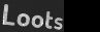

UNDERPAYS            | UNDEPAYS             | UNDERPAYS           


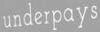

FLAMEPROOFED         | PHONRNAGY            | BIRRUINGSYT         


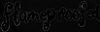

ENTICEMENTS          | EANITIIEMENTST       | ENIICEMENTSYTI      


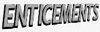

UKASE                | UHASESE              | USESERT             


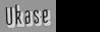

In [50]:
# ==========================================
# 1. 두 개의 모델(Epoch 10, Epoch 50) 로드
# ==========================================

# 경로 설정 (사용자 환경에 맞게 수정 필요)
ckpt_path_10 = "./MJ/model_checkpoint_epoch_10.pth" 
if os.path.exists(ckpt_path_10):
    model_10 = CRNN(num_chars=len(label_converter.character)).to(device)
    model_10.load_state_dict(torch.load(ckpt_path_10))
    acc_10, cer_10 = evaluate_model(model_10, test_loader, label_converter, device)
    print(f"Epoch 10 Model - Accuracy: {acc_10:.4f}, CER: {cer_10:.4f}")
else:
    print("Epoch 10 체크포인트가 없습니다.")

# 2. Epoch 50(Best) 모델 평가
ckpt_path_best = "./MJ/model_checkpoint.pth"
if os.path.exists(ckpt_path_best):
    model_50 = CRNN(num_chars=len(label_converter.character)).to(device)
    model_50.load_state_dict(torch.load(ckpt_path_best))
    acc_50, cer_50 = evaluate_model(model_50, test_loader, label_converter, device)
    print(f"Epoch 50 Model - Accuracy: {acc_50:.4f}, CER: {cer_50:.4f}")
else:
    print("Epoch 50(Best) 체크포인트가 없습니다.")

# 모델 구조 초기화
model_10 = CRNN(num_chars=num_chars).to(device)
model_50 = CRNN(num_chars=num_chars).to(device)

# 가중치 로드 (map_location은 gpu/cpu 상황에 맞게 자동 처리)
model_10.load_state_dict(torch.load(ckpt_path_10, map_location=device))
model_50.load_state_dict(torch.load(ckpt_path_50, map_location=device))

model_10.eval()
model_50.eval()


# ==========================================
# 2. 데이터셋에서 두 모델 결과 한눈에 비교하기
# ==========================================

def compare_two_models(dataset, model_a, model_b, label_converter, num_samples=10):
    print(f"{'Ground Truth':<20} | {'Epoch 10 Pred':<20} | {'Epoch 50 Pred':<20}")
    print("-" * 70)
    
    for i in range(num_samples):
        img, encoded_label, label_len, raw_label = dataset[i]
        
        # 모델 입력 차원 추가: (3, 32, 100) -> (1, 3, 32, 100)
        img_tensor = torch.tensor(img[np.newaxis, ...], dtype=torch.float32).to(device)
        
        # 추론
        with torch.no_grad():
            output_a = model_a(img_tensor)
            output_b = model_b(img_tensor)
        
        # 디코딩
        pred_a = decode_greedy(output_a, label_converter)[0]
        pred_b = decode_greedy(output_b, label_converter)[0]
        
        # 결과 출력 (텍스트)
        print(f"{raw_label:<20} | {pred_a:<20} | {pred_b:<20}")
        
        # 이미지 시각화 (필요시 주석 해제)
        display(Image.fromarray(img.transpose(1,2,0).astype(np.uint8)))

# 실행
compare_two_models(test_dataset, model_10, model_50, label_converter, num_samples=10)

자체 데이터 테스트

In [53]:
# EasyOCR Reader 생성 (필요한 언어 설정, 예: 영어)
reader = easyocr.Reader(['en'])

SAMPLE_IMG_PATH = "C:\\Users\\user\\Desktop\\test data\\self data1.jpg"

def detect_text(img_path):
    # PIL로 이미지 열기
    img_pil = Image.open(img_path).convert('RGB')
    # EasyOCR은 numpy 배열을 입력받으므로 변환
    img_np = np.array(img_pil)

    # EasyOCR을 이용한 텍스트 검출 및 인식
    # 결과 형식: [(bbox, text, confidence), ...]
    ocr_result = reader.readtext(img_np)

    # 시각화를 위해 ImageDraw 객체 생성
    img_draw = ImageDraw.Draw(img_pil)
    cropped_imgs = []

    for bbox, text, conf in ocr_result:
        # 좌표를 정수형으로 변환
        bbox_int = [(int(x), int(y)) for x, y in bbox]
        img_draw.polygon(bbox_int, outline='red')

        xs = [pt[0] for pt in bbox_int]
        ys = [pt[1] for pt in bbox_int]
        x_min = max(0, min(xs) - 5)
        y_min = max(0, min(ys) - 5)
        x_max = max(xs) + 5
        y_max = max(ys) + 5
        word_box = (x_min, y_min, x_max, y_max)
        cropped_imgs.append(img_pil.crop(word_box))

    return img_pil, cropped_imgs, ocr_result


def recognize_img(pil_img, input_img_size=(100, 32)):
    # TODO: 잘려진 단어 이미지를 인식하는 코드를 작성하세요!

    # PIL 이미지를 numpy 배열로 변환
    img_np = np.array(pil_img)
    # 인식 모델 입력 크기에 맞게 이미지 크기 조정
    img_resized = cv2.resize(img_np, input_img_size)

    # detail=0 옵션은 인식 결과의 텍스트만 반환합니다.
    result = reader.readtext(img_resized, detail=0, paragraph=False)

    if result:
        recognized_text = result[0]
    else:
        recognized_text = ""

    print("Recognized text:", recognized_text)
    return recognized_text

총 8개의 이미지를 처리합니다...

>>> 파일명: self data1.jpg


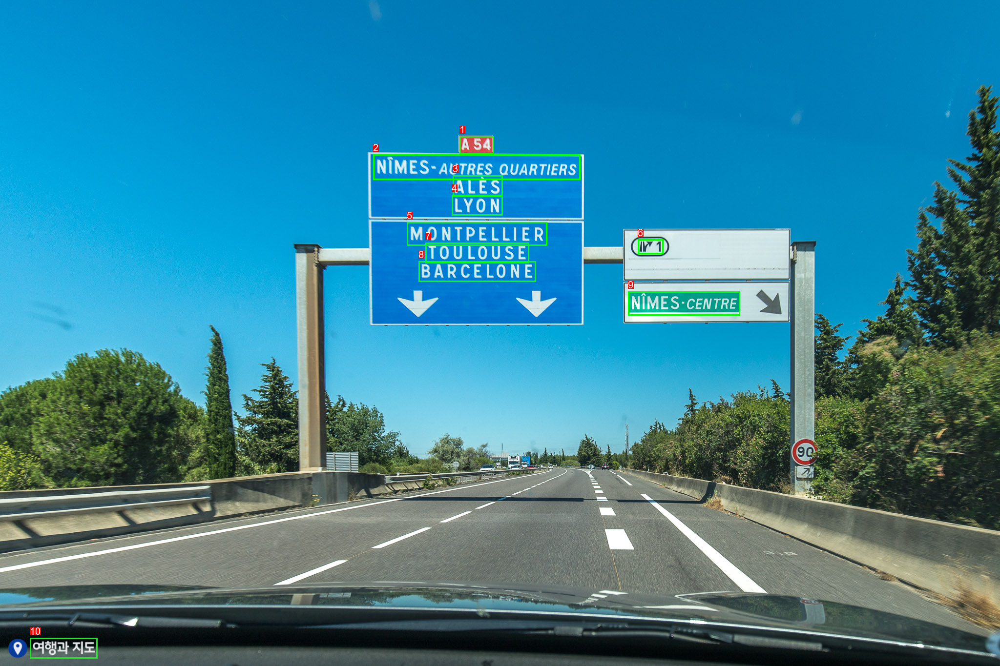


[인식 결과 비교]
No.   | EasyOCR (Pretrained)           | My Model (Custom)              | Conf  
-------------------------------------------------------------------------------------
1     | A 54                           | ANSSKYSYHY                     | 0.99
2     | NIMeS" AUTRES QUARTIERS        | WIPQLUIRSYS                    | 0.21
3     | ALES                           | ATESTH                         | 0.66
4     | Lyon                           | RXEONESEST                     | 0.93
5     | MONTPELLIER                    | TINTMODFTFERDSDYT              | 0.74
6     | Iv1                            | INESERTE                       | 0.70
7     | TOULOUSE                       | TAUNEAUISEST                   | 0.99
8     | BARCELONE                      | FHANEDAESYE                    | 1.00
9     | NIMES CENTRE                   | MIECTLTEST                     | 0.63
10    | qozt TIE                       | COIOGUZESR                     | 0.44


>>> 파일명: self data2.jpg


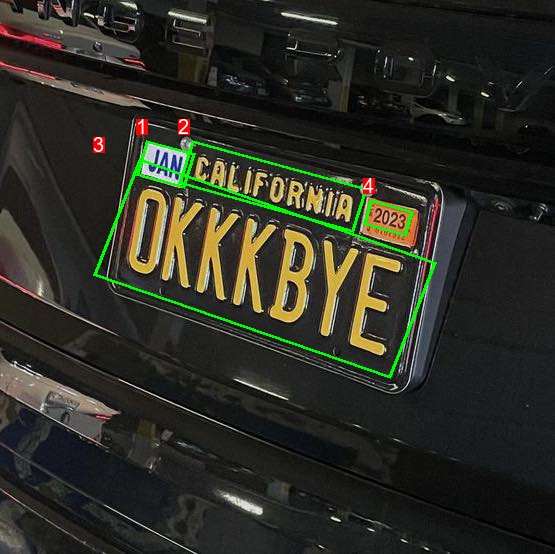


[인식 결과 비교]
No.   | EasyOCR (Pretrained)           | My Model (Custom)              | Conf  
-------------------------------------------------------------------------------------
1     | W                              | PIPESRP                        | 0.20
2     | (calIFORNIA                    | RUTTOOHMINYT                   | 0.44
3     | OKKKBVE                        | ONBIDESDSYRP                   | 0.49
4     | {2023                          | BLERSDSDRYP                    | 0.42


>>> 파일명: self data3.jpg


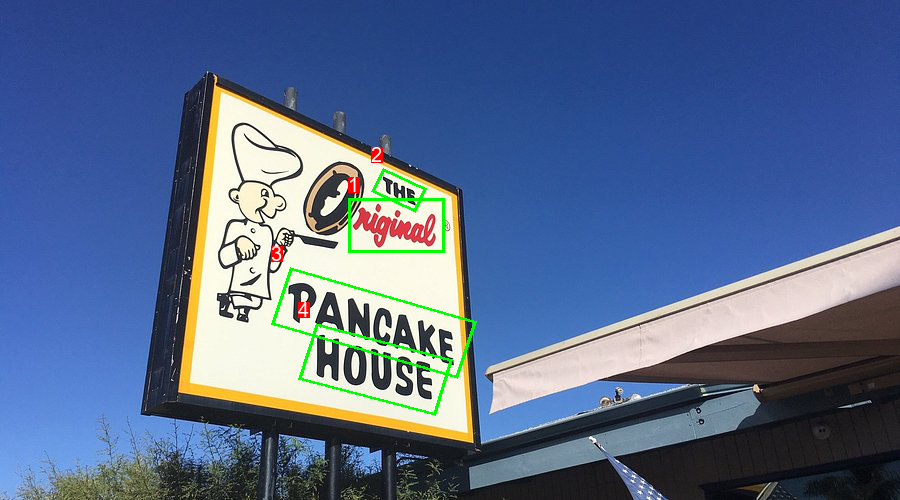


[인식 결과 비교]
No.   | EasyOCR (Pretrained)           | My Model (Custom)              | Conf  
-------------------------------------------------------------------------------------
1     | Iriginnl 5                     | MEOELYT                        | 0.12
2     | The                            | DINGSYP                        | 0.63
3     | PANCAKE                        | PACCNSISYSYR                   | 0.65
4     | House                          | COIUYSYIP                      | 0.56


>>> 파일명: self data4.png


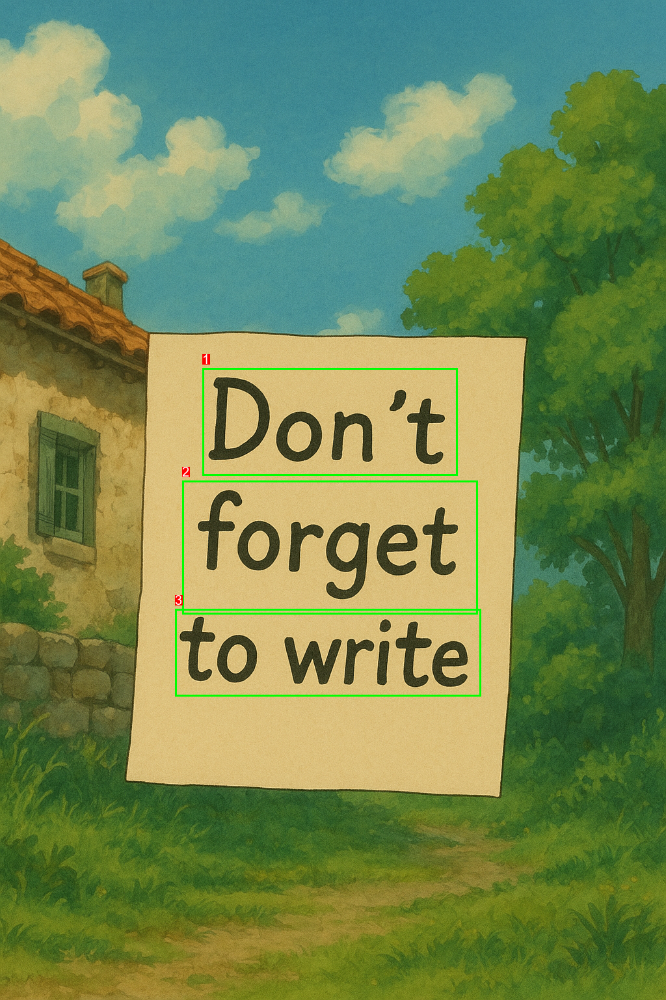


[인식 결과 비교]
No.   | EasyOCR (Pretrained)           | My Model (Custom)              | Conf  
-------------------------------------------------------------------------------------
1     | Don't                          | DONT                           | 0.68
2     | forget                         | FORGETYT                       | 1.00
3     | to write                       | TOWITESESR                     | 1.00


>>> 파일명: self data5.jpg


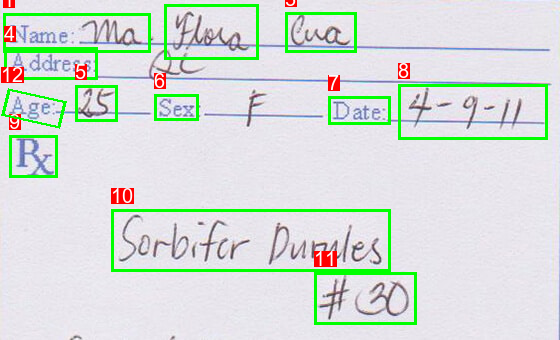


[인식 결과 비교]
No.   | EasyOCR (Pretrained)           | My Model (Custom)              | Conf  
-------------------------------------------------------------------------------------
1     | Name: Ma =                     | INREEAMIALTLY                  | 0.50
2     | SLxa                           | MEISTIHYTHP                    | 0.09
3     | Cua                            | TECAKSYT                       | 0.88
4     | Address:                       | IEDRESSTYT                     | 0.74
5     | 26                             | LSSTIRP                        | 0.30
6     | Sex                            | TEMLTIT                        | 0.67
7     | Date:_                         | DPETTETYT                      | 0.98
8     | 4-9-1                          | POEITYTI                       | 0.36
9     | R                              | ERYTYP                         | 0.43
10    | Serbftr  burules               | STHRTLUMES                     | 0.28
11    | #20                    

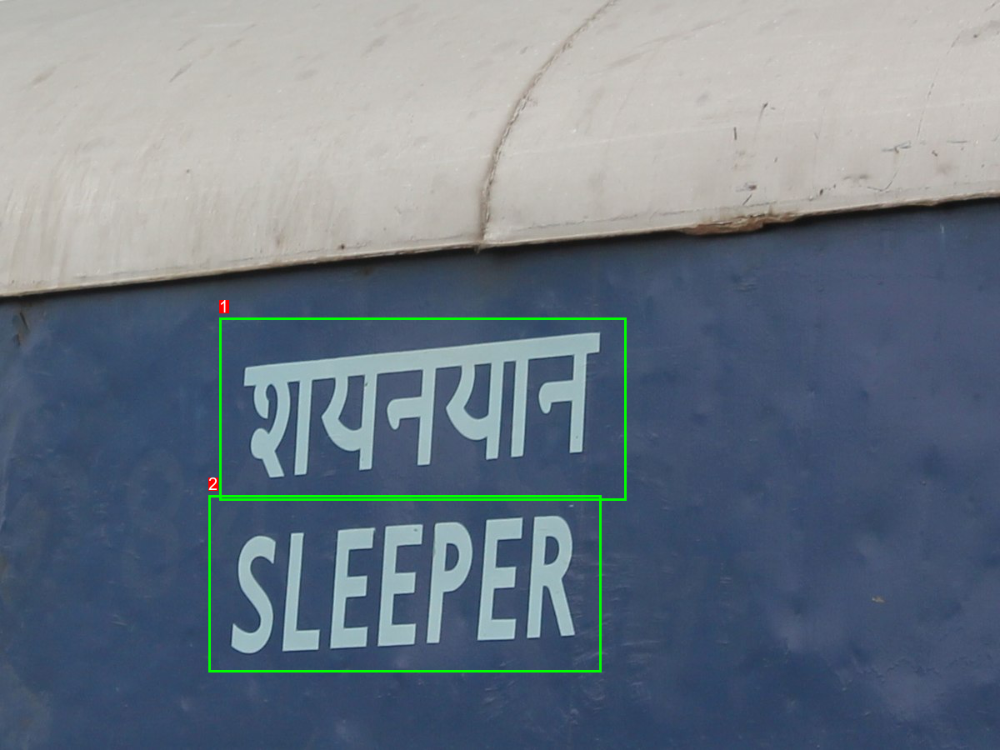


[인식 결과 비교]
No.   | EasyOCR (Pretrained)           | My Model (Custom)              | Conf  
-------------------------------------------------------------------------------------
1     | 147417                         | TUGTIRFDTIYTI                  | 0.20
2     | SLEEPER                        | SLEEPER                        | 1.00


>>> 파일명: self data8.jpg


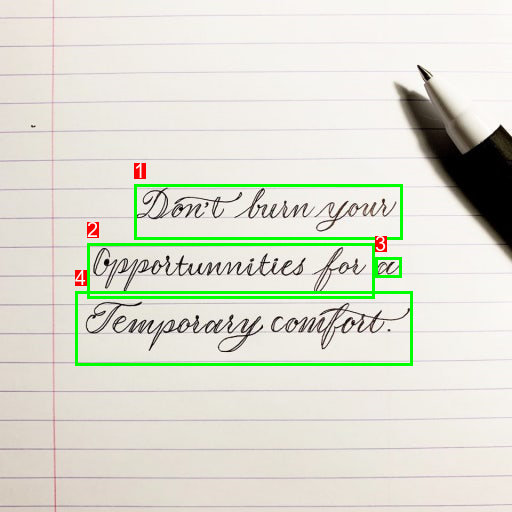


[인식 결과 비교]
No.   | EasyOCR (Pretrained)           | My Model (Custom)              | Conf  
-------------------------------------------------------------------------------------
1     | Dont bun @owv                  | LNTTHMNASYT                    | 0.21
2     | Gottunmities fou               | CPEPSTHNLNIATHSYYT             | 0.18
3     | CU                             | POSDSYRPR                      | 0.92
4     | Tempotaxy contfoitz'           | IOMPAROAGTESRYRT               | 0.11


>>> 파일명: self data9.jpg


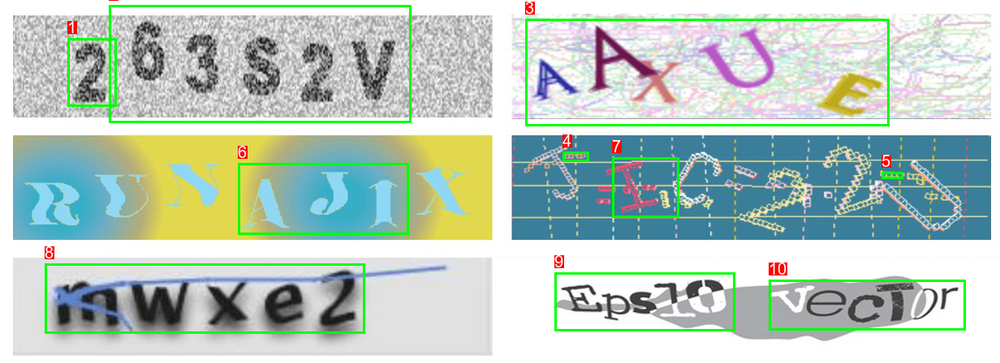


[인식 결과 비교]
No.   | EasyOCR (Pretrained)           | My Model (Custom)              | Conf  
-------------------------------------------------------------------------------------
1     | 2                              | BSYRP                          | 0.92
2     | 6382v                          | BOSSVYVYTR                     | 0.53
3     | AAxU €                         | NAXATESYR                      | 0.20
4     | 0                              | RATNTESDSRI                    | 0.18
5     | Jeca                           | IONRDINESYRT                   | 0.08
6     | A JI                           | ICRBSTYTI                      | 0.95
7     | TJ                             | BEIYTYP                        | 0.04
8     | mwxez                          | RAWXEZTY                       | 0.74
9     | Eps70                          | FLSSASYT                       | 0.56
10    | vector                         | VEOCIDRSRYT                    | 0.85




In [55]:
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import torch
import glob
import os

# ==========================================
# 5. (수정됨) 이미지엔 박스만, 결과는 아래에 출력
# ==========================================

def test_custom_data_visualize(folder_path, custom_model, pretrained_reader, label_converter):
    """
    이미지 위에 바운딩 박스와 번호를 표시하고,
    인식된 텍스트 결과(EasyOCR vs Custom)는 이미지 하단에 텍스트로 출력합니다.
    """
    # 파일 리스트 가져오기
    image_files = glob.glob(f"{folder_path}/*.jpg") + glob.glob(f"{folder_path}/*.png")
    image_files.sort()
    
    if not image_files:
        print("폴더에 이미지가 없습니다.")
        return

    print(f"총 {len(image_files)}개의 이미지를 처리합니다...\n")

    # 폰트 로드 (이미지 위에 번호를 그리기 위함)
    try:
        font = ImageFont.truetype("arial.ttf", 20) # 번호 크기 키움
    except IOError:
        font = ImageFont.load_default()

    for img_path in image_files:
        try:
            print("=" * 80)
            print(f">>> 파일명: {os.path.basename(img_path)}")
            
            # 1. 이미지 로드
            img = Image.open(img_path).convert('RGB')
            img_np = np.array(img)
            
            # 그리기 도구 생성
            draw = ImageDraw.Draw(img)
            
            # 2. EasyOCR로 텍스트 위치 검출
            ocr_results = pretrained_reader.readtext(img_np)
            
            # 결과를 저장할 리스트
            comparison_results = []

            # 3. 각 텍스트 영역 처리 (enumerate로 번호 매기기)
            for idx, (bbox, pre_text, conf) in enumerate(ocr_results, start=1):
                # ------------------------------------------------
                # A. 바운딩 박스 및 번호 그리기 (이미지)
                # ------------------------------------------------
                points = [tuple(pt) for pt in bbox]
                
                # 박스 그리기 (초록색, 두께 3)
                draw.polygon(points, outline=(0, 255, 0), width=3)
                
                # 박스 왼쪽 상단 좌표 찾기
                xs = [pt[0] for pt in bbox]
                ys = [pt[1] for pt in bbox]
                x_min = max(0, int(min(xs)))
                x_max = min(img.width, int(max(xs)))
                y_min = max(0, int(min(ys)))
                y_max = min(img.height, int(max(ys)))

                # 번호 표시 (빨간색 배경에 흰 글씨) - 어떤 박스가 어떤 결과인지 매칭용
                index_label = str(idx)
                
                # 텍스트 배경 박스 계산 (draw.textbbox는 pillow 최신버전, 구버전은 textsize)
                try:
                    text_bbox = draw.textbbox((x_min, y_min - 25), index_label, font=font)
                except AttributeError:
                    # 구버전 Pillow 호환
                    w, h = font.getsize(index_label)
                    text_bbox = (x_min, y_min - 25, x_min + w, y_min - 25 + h)

                draw.rectangle(text_bbox, fill="red")
                draw.text((x_min, y_min - 25), index_label, font=font, fill="white")

                # ------------------------------------------------
                # B. Custom Model 추론
                # ------------------------------------------------
                if (x_max - x_min) < 5 or (y_max - y_min) < 5:
                    continue # 너무 작은 영역 패스

                # Crop & Preprocess
                cropped_img = img.crop((x_min, y_min, x_max, y_max))
                input_tensor = process_img_for_custom_model(cropped_img)
                
                # Inference
                custom_model.eval()
                with torch.no_grad():
                    output = custom_model(input_tensor)
                
                # Decode
                custom_pred = decode_greedy(output, label_converter)[0]
                
                # 결과 저장
                comparison_results.append({
                    "id": idx,
                    "easyocr": pre_text,
                    "custom": custom_pred,
                    "conf": conf
                })

            # 4. 이미지 출력 (박스와 번호만 표시됨)
            display(img)

            # 5. 결과 텍스트 출력 (이미지 하단)
            print(f"\n[인식 결과 비교]")
            print(f"{'No.':<5} | {'EasyOCR (Pretrained)':<30} | {'My Model (Custom)':<30} | {'Conf':<6}")
            print("-" * 85)
            
            if not comparison_results:
                print("  >> 텍스트가 검출되지 않았습니다.")
            
            for res in comparison_results:
                print(f"{res['id']:<5} | {res['easyocr']:<30} | {res['custom']:<30} | {res['conf']:.2f}")
            print("\n")

        except Exception as e:
            print(f"이미지 처리 중 에러 발생: {e}")

# ==========================================
# 실행
# ==========================================

# 자체 데이터가 들어있는 폴더 경로
MY_DATA_PATH = "./test data"  

# 함수 실행
test_custom_data_visualize(MY_DATA_PATH, model_50, reader, label_converter)

# **결론**

1. training 결과
- train loss를 확인해보면 Epoch가 진행됨에 따라 꾸준히 감소하여 최종적으로 매우 낮은 수치에 도달하였다. 하지만 검증 데이터에 대한 Loss를 확인해보면 감소하다가 정체되거나 꺽여서 올라가려는 모습이 보였다. 이를 통해서 모델이 과적합이 발생하였다고 고려된다. 추후 과적합을 방지하는 방법을 고려해봐야할것같다.  

![학습결과](./result1.png)  

2. 성능 비교
- 학습을 진행한 결과 10 Epoch쯤에서 검증의 Loss가 낮았고 train Loss가 가장 낮았던 50 Epoch의 모델을 비교해봤다. 학습을 오래 진행했음에도 과적합으로 성능향상은 거의 없었다고 볼수있다.  


10 Epoch vs 50 Epoch
| 모델 | 정확도 (Accuracy) | 문자 오류율 (CER) |
|:---:|:---:|:---:|
| Epoch 10 | 11.29% | 0.3950 |
| Epoch 50 | 11.34% | 0.3933 |
  
10 Epoch vs 50 Epoch 비교 예시  
| Ground Truth | Epoch 10 Pred | Epoch 50 Pred |
| :---: | :---: | :---: |
| SLINKING | SLIKINGSGY | SLIKINGSG |
| REMODELERS | REDLIS | RENODATST |
| CHRONOGRAPHS | CHAEAPPOPS | CHEONRERPOPHS |
| IMPEACHING | IMPPEAACHINGSGY | IMPEACHINGSGYG |
| DISCOMBOBULATED | TUEANBALY | FIERNHTBEREDYT |
  
  
- 결론적으로 Early Stopping을 사용했다면 학습시간을 줄이면서 비슷한 성능을 확인할 수 있었을것 같다.  



3. EasyOCR과 성능비교
- 직접 학습시킨 모델과 기존 Pretrained 모델의 성능도 비교해보기 위해서 직접 수집한 데이터셋으로 성능을 확인해봤다.
해당 데이터에는 차량 표지판, 번호판, 손글씨, 그림 등 다양한 경우가 포함되어있다.  
  
  
실험 결과, 직접 학습 시킨 모델의 성능이 확연하게 떨어지는 것을 확인할 수 있었다. 사람도 못알아볼정도의 손글씨는 둘다 인식하지 못했지만 글씨가 크고 충분히 인식가능하다고 판단되었던 것들도 자체 모델은 인식하지 못하였다. 학습시킨 데이터셋과 달라서 그런것으로 생각된다. 

4. 최종 결론
- 해당 프로젝트를 통해서 CRNN 구조를 구축하고 학습 시켰으며 학습 결과를 가지고 직접 성능을 확인하는 것을 완료했다. 하지만 데이터의 일관성때문에 과적합이 발생하였고 그로인해 실제 데이터에 대한 일반화 성능이 낮게 나왔다는 한계점을 발견했다. 이를 개선하기 위해 Data augmentaion 기법을 사용해 학습의 다양성을 확보할 예정이다. 